In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


frames = 300
speed = 0.05

In [8]:
verts = np.array([
    [-1, -1, -1],
    [ 1, -1, -1],
    [ 1,  1, -1],
    [-1,  1, -1],
    [-1, -1,  1],
    [ 1, -1,  1],
    [ 1,  1,  1],
    [-1,  1,  1], ], dtype=float) * 0.7


edges = [ (0,1), (1,2), (2,3), (3,0),   # bottom square
    (4,5), (5,6), (6,7), (7,4),   # top square
    (0,4), (1,5), (2,6), (3,7) ]   # vertical pillars



In [9]:
#Rotation matrices
def Rx(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([[1, 0, 0],
                     [0, c,-s],
                     [0, s, c]])

def Ry(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([[ c, 0, s],
                     [ 0, 1, 0],
                     [-s, 0, c]])

def Rz(theta):
    c, s = np.cos(theta), np.sin(theta)
    return np.array([[c,-s, 0],
                     [s, c, 0],
                     [0, 0, 1]])

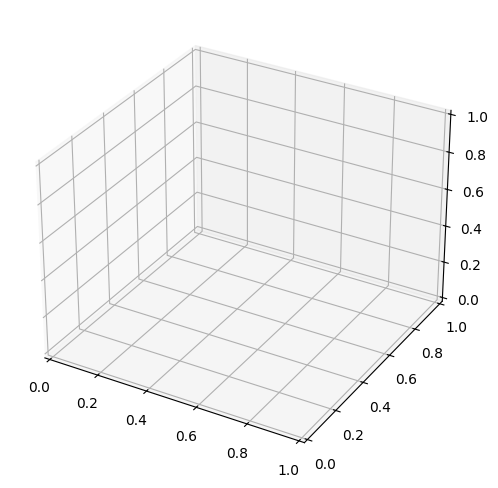

In [10]:

# Apply rotation to all vertices
def rotate_points(points, ax_angle, ay_angle, az_angle):
    R = Rz(az_angle) @ Ry(ay_angle) @ Rx(ax_angle)
    return points @ R.T

# Axes
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')


In [11]:
ax.view_init(elev=20, azim=35)
ax.set_xlim(-1.2, 1.2)
ax.set_ylim(-1.2, 1.2)
ax.set_zlim(-1.2, 1.2)
ax.set_box_aspect([1,1,1])  # equal aspect ratio
ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
ax.set_title("3D Rotating Cube (Matplotlib 3D)")


Text(0.5, 0.92, '3D Rotating Cube (Matplotlib 3D)')

In [12]:
lines = []
for (i, j) in edges:
    (line,) = ax.plot(
        [verts[i,0], verts[j,0]],
        [verts[i,1], verts[j,1]],
        [verts[i,2], verts[j,2]],
        linewidth=2
    )
    lines.append(line)


In [18]:
def update(frame_idx):
    # Angles change over time for smooth rotation
    ax_angle = speed * frame_idx
    ay_angle = speed * 0.8 * frame_idx
    az_angle = speed * 1.2 * frame_idx

    rot = rotate_points(verts, ax_angle, ay_angle, az_angle)
    for line, (i, j) in zip(lines, edges):
        x = [rot[i,0], rot[j,0]]
        y = [rot[i,1], rot[j,1]]
        z = [rot[i,2], rot[j,2]]
        line.set_data(x, y)
        line.set_3d_properties(z)

    return lines

In [19]:
anim = FuncAnimation(fig, update, frames=frames, interval=30, blit=False)
HTML(anim.to_jshtml())